In [1]:
using Omega
using StatsBase
using Random
using Plots
using Distributions

In [2]:
Random.seed!(123)

MersenneTwister(UInt32[0x0000007b], Random.DSFMT.DSFMT_state(Int32[1464307935, 1073116007, 222134151, 1073120226, -290652630, 1072956456, -580276323, 1073476387, 1332671753, 1073438661  …  138346874, 1073030449, 1049893279, 1073166535, -1999907543, 1597138926, -775229811, 32947490, 382, 0]), [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], UInt128[0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000  …  0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x0000000000000

In [3]:
function one_simulation_prey(rng, n, transitions)

    """
    Simulates one step of gillespie for prey.
    """

    #t = t_list[n](rng)
    hazard_result = hazards_list[n](rng)
    prey_val = prey_list[n](rng)
    labels = ["spawn_prey", "pred_dies","prey2pred"]
    transition = transitions[labels[hazard_result]]
    new_prey = prey_val + transition[1]

    # Enforce only positive integers
    max(1, new_prey)

end

function one_simulation_pred(rng, n, transitions)

    """
    Simulates one step of gillespie for pred.
    """

    #t = t_list[n](rng)
    hazard_result = hazards_list[n](rng)
    pred_val = pred_list[n](rng)
    labels = ["spawn_prey", "pred_dies","prey2pred"]
    transition = transitions[labels[hazard_result]]
    new_pred = pred_val + transition[2]

    # Enforce only positive integers
    max(1, new_pred)

end

function get_hazards(rng, n)
    """
    Compute the hazard function given the current states.  Note that in this
        model the function depends only on state, not time, though this is not
        the case in general. "spawn_prey" represents the event of a prey being born,
        "prey2pred" represents a predator consuming a new prey and consequently spawning
        a new predator, "pred_dies" represents the death of a predator.

    args:
        ecology(dict): a dictionary containing species counts.
        theta(dict): A dictionary where keys represent events (reactions) and
            values are the location hyperparameters for rate parameter constants
            corresponding to those events.
    """

    ecology = Dict("prey" => prey_list[n](rng), "pred" => pred_list[n](rng))

    hazards = Dict(
        "spawn_prey" => theta(rng)["spawn_prey"] * ecology["prey"],
        "prey2pred" => theta(rng)["prey2pred"] * ecology["prey"] * ecology["pred"],
        "pred_dies" => theta(rng)["pred_dies"] * ecology["pred"]
        )

    vals = collect(values(hazards))
    sum_vals = sum(vals)
    prob_vals = vals/sum_vals
    categorical(rng, prob_vals)
end

function generate_rates(rng)

    Dict("spawn_prey" => spawn_prey(rng),
         "prey2pred" => prey2pred(rng),
         "pred_dies" => pred_dies(rng))

end


generate_rates (generic function with 1 method)

In [4]:
## Initialize paramters
Pre = [[1, 0], [1, 1], [0, 1]]
Post = [[2, 0], [0, 2], [0, 0]]
transition_mat = Post - Pre
transitions = Dict("spawn_prey" => transition_mat[1,],
                    "prey2pred" => transition_mat[2,],
                    "pred_dies" => transition_mat[3,])


Dict{String,Array{Int64,1}} with 3 entries:
  "spawn_prey" => [1, 0]
  "pred_dies"  => [0, -1]
  "prey2pred"  => [-1, 1]

In [5]:
#t0=0.0
# Random variables for starting values
prey_init = normal(100, 10)
pred_init = normal(50, 10)
# Random variables for rates

spawn_prey = normal(1, 0.1)
prey2pred = normal(0.01,0.001)
pred_dies = normal(0.5,0.05)


5:Normal(0.5, 0.05)::Float64

In [6]:
## Generate Model
hazards_list = Any[]
prey_list = Any[]
pred_list = Any[]
theta = ciid(generate_rates)
push!(prey_list, prey_init)
push!(pred_list, pred_init)
N = 5000

for f in 2:N
    last = f - 1
    hazards_temp = ciid(get_hazards, last) # individual step
    prey_temp = ciid(one_simulation_prey, last, transitions) # individual step
    pred_temp = ciid(one_simulation_pred, last, transitions) # individual step
    push!(hazards_list, hazards_temp)
    push!(prey_list, prey_temp)
    push!(pred_list, pred_temp)
end

random_var_tuple = (Tuple(x for x in hazards_list)...,
                Tuple(x for x in prey_list)...,
                Tuple(x for x in pred_list)...,
                Tuple(Any[spawn_prey,prey2pred,pred_dies,theta])...)


(7:reifyapply(get_hazards, 1)::Any, 10:reifyapply(get_hazards, 2)::Any, 13:reifyapply(get_hazards, 3)::Any, 16:reifyapply(get_hazards, 4)::Any, 19:reifyapply(get_hazards, 5)::Any, 22:reifyapply(get_hazards, 6)::Any, 25:reifyapply(get_hazards, 7)::Any, 28:reifyapply(get_hazards, 8)::Any, 31:reifyapply(get_hazards, 9)::Any, 34:reifyapply(get_hazards, 10)::Any, 37:reifyapply(get_hazards, 11)::Any, 40:reifyapply(get_hazards, 12)::Any, 43:reifyapply(get_hazards, 13)::Any, 46:reifyapply(get_hazards, 14)::Any, 49:reifyapply(get_hazards, 15)::Any, 52:reifyapply(get_hazards, 16)::Any, 55:reifyapply(get_hazards, 17)::Any, 58:reifyapply(get_hazards, 18)::Any, 61:reifyapply(get_hazards, 19)::Any, 64:reifyapply(get_hazards, 20)::Any, 67:reifyapply(get_hazards, 21)::Any, 70:reifyapply(get_hazards, 22)::Any, 73:reifyapply(get_hazards, 23)::Any, 76:reifyapply(get_hazards, 24)::Any, 79:reifyapply(get_hazards, 25)::Any, 82:reifyapply(get_hazards, 26)::Any, 85:reifyapply(get_hazards, 27)::Any, 88:reifyap

Internal error: encountered unexpected error in runtime:
StackOverflowError()
intersect at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2957
intersect_unionall_ at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2553
intersect_unionall at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2602
intersect at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:0
intersect_unionall_ at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2557
intersect_unionall at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2602
intersect at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2981
intersect_unionall_ at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2557
intersect_unionall at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2602
intersect at /Users/julia/buildbot/worker/package_macos64/build/src/subtype.c:2981
intersect_all at /Users/julia/buildbot

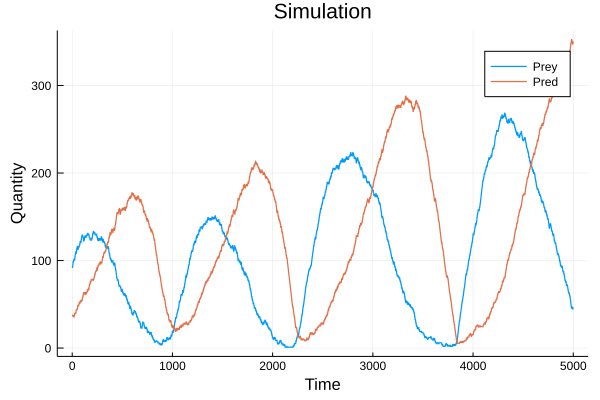

In [7]:

## Sample
samples = rand(random_var_tuple,
                2, alg = RejectionSample)
# extract run results and plot
prey_vals = []
pred_vals = []
for x in 1:(N-1)
    push!(prey_vals,samples[2][N+x])
    push!(pred_vals,samples[2][(N*2)+x])
end

plot(hcat(prey_vals,pred_vals),
        title = "Simulation",
        xlabel = "Time",
        ylabel = "Quantity",
        label = ["Prey" "Pred"],
        lw = 1.25)



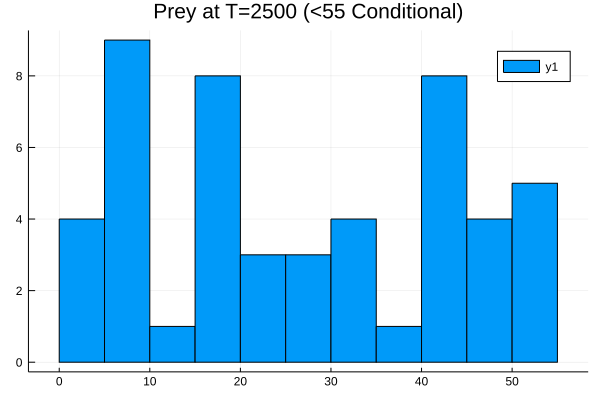

In [8]:
## Sample with conditional
samples = rand(random_var_tuple, random_var_tuple[7500] < 55,
                50, alg = RejectionSample)

# Histogram to test that conditional worked
compile = []
for x in 1:50
    push!(compile, samples[x][7500])
end
histogram(compile, bins = 10,
        title = "Prey at T=2500 (<55 Conditional)")



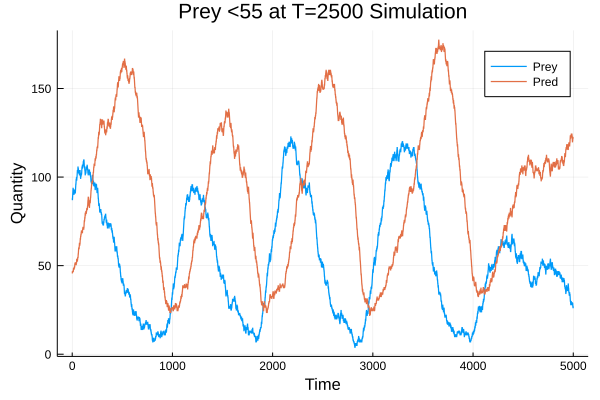

In [9]:
# extract run results and plot
prey_vals = []
pred_vals = []
for x in 1:(N-1)
    push!(prey_vals,samples[1][N+x])
    push!(pred_vals,samples[1][(N*2)+x])
end

plot(hcat(prey_vals,pred_vals),
        title = "Prey <55 at T=2500 Simulation",
        xlabel = "Time",
        ylabel = "Quantity",
        label = ["Prey" "Pred"],
        lw = 1.25)


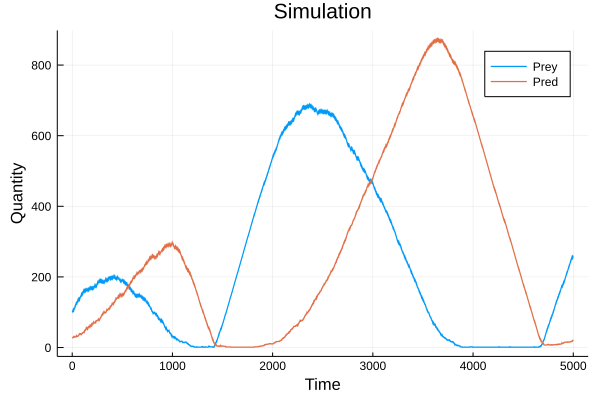

In [10]:
## Counterfactual
samples = rand(random_var_tuple, 1, alg = RejectionSample)

# extract run results and plot
prey_vals = []
pred_vals = []
for x in 1:(N-1)
    push!(prey_vals,samples[1][N+x])
    push!(pred_vals,samples[1][(N*2)+x])
end

plot(hcat(prey_vals,pred_vals),
        title = "Simulation",
        xlabel = "Time",
        ylabel = "Quantity",
        label = ["Prey" "Pred"],
        lw = 1.25)



In [12]:
new_prey_5 = replace(prey_list[500], prey_list[499] => 500.0)
prey_list[10] = new_prey_5
random_var_tuple = (Tuple(x for x in hazards_list)...,
                Tuple(x for x in prey_list)...,
                Tuple(x for x in pred_list)...,
                Tuple(Any[spawn_prey,prey2pred,pred_dies,theta])...)
adj_samples = rand(random_var_tuple, 1, alg = RejectionSample)

# extract run results and plot
prey_vals = []
pred_vals = []
for x in 1:(N-1)
    push!(prey_vals,adj_samples[1][N+x])
    push!(pred_vals,adj_samples[1][(N*2)+x])
end

plot(hcat(prey_vals,pred_vals),
        title = "Intervention Prey T10=300",
        xlabel = "Time",
        ylabel = "Quantity",
        label = ["Prey" "Pred"],
        lw = 1.25)


LoadError: StackOverflowError: